In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!pip install pds4_tools

In [ ]:
import numpy as np
import pandas as pd
import os
import pds4_tools
import cv2 as cv
from google.colab.patches import cv2_imshow
import xml.etree.ElementTree as ET
from concurrent.futures import ThreadPoolExecutor, as_completed

In [ ]:
xml_path = '/content/drive/MyDrive/OHRC/set 4 /data/calibrated/20240406/ch2_ohr_ncp_20240406T0052354542_d_img_d18.xml'
iso_path = '/content/drive/MyDrive/OHRC/set 4 /data/calibrated/20240406/ch2_ohr_ncp_20240406T0052354542_d_img_d18.img'
png_path ='/content/drive/MyDrive/OHRC/set 4 /browse/calibrated/20240406/ch2_ohr_ncp_20240406T0052354542_b_brw_d18.png'

In [ ]:
tree = ET.parse(xml_path)
root = tree.getroot()
print(root)

<Element '{http://pds.nasa.gov/pds4/pds/v1}Product_Observational' at 0x7deef9911cb0>


<li> Element.findall() finds only elements with a tag which are direct children of the current element. Findall(match, namespaces=None):
Finds all matching subelements, by tag name or path. Returns a list containing all matching elements in document order. namespaces is an optional mapping from namespace prefix to full name. Pass '' as prefix to move all unprefixed tag names in the expression into the given namespace.
<li> Element.get() accesses the element’s attributes:

In [ ]:
namespaces = {
    'pds': 'http://pds.nasa.gov/pds4/pds/v1',
    'isda': 'https://isda.issdc.gov.in/pds4/isda/v1',
}
element_tags = root.findall('.//pds:elements', namespaces)
element_tags

[<Element '{http://pds.nasa.gov/pds4/pds/v1}elements' at 0x7deef992da30>,
 <Element '{http://pds.nasa.gov/pds4/pds/v1}elements' at 0x7deef992dcb0>]

.//: This XPath expression specifies a recursive search throughout the entire document (descendant axis).
<br><br>
pds:elements: This part defines the element to search for.<br>
pds: The prefix for the "elements" element, referencing the namespace definition in the dictionary.<br>
elements: The actual element name you're looking for.
<br><br>
namespaces dictionary is passed as an argument to tell findall how to interpret the prefixed element name (pds:elements). It looks up the prefix (pds) in the dictionary and uses the corresponding namespace URL (http://pds.nasa.gov/pds4/pds/v1) for the actual search.

In [ ]:
def get_image_shape(xml_file):
    tree = ET.parse(xml_file)
    root = tree.getroot()
    element_tags = root.findall('.//pds:elements', namespaces)
    #'pds' in the first argument will be replaced with the definition of pds from the dictionary namespaces
    #same as running the code: root.findall('{http://pds.nasa.gov/pds4/pds/v1}elements')
    shape = []
    for element in element_tags:
        shape.append(int(element.text))

    return shape

In [ ]:
with open(iso_path, 'rb') as _file:
    img_data = _file.read()
reshape_shape = get_image_shape(xml_path)
print(reshape_shape)
img = np.frombuffer(img_data, dtype=np.uint8)
#np.frombuffer(img_data, dtype=np.uint8) takes a binary string (img_data) and converts it into a NumPy array of unsigned 8-bit integers
image = np.reshape(img, reshape_shape)

[101075, 12000]


In [ ]:
img.shape

(1212900000,)

In [ ]:
tile_y =int(600*(101075/12000))
tile_x = 600
tile_x, tile_y

(600, 5053)

In [ ]:
def break_into_tiles(image, tile_size):
    try:
      image = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
    except:
      pass
    height, width = image.shape
    tiles = []

    for y in range(0, height, tile_size[1]):
        for x in range(0, width, tile_size[0]):
            tile = (image[y:y+tile_size[1], x:x+tile_size[0]]).astype(np.uint8)
            tiles.append(tile)

    return tiles

In [ ]:
image_tiles = break_into_tiles(image, (tile_x, tile_y))

In [ ]:
len(image_tiles)

420

In [ ]:
type(image_tiles[0])

numpy.ndarray

In [ ]:
s=200
for i in range(s, s+5):
  print(i)
  cv2_imshow(image_tiles[i])

In [ ]:
image_tiles[200].shape

(5053, 600)

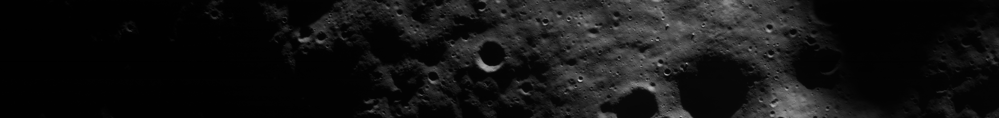

In [ ]:
img = cv.rotate(image_tiles[200], cv.ROTATE_90_CLOCKWISE)
cv2_imshow(img)

# Functions

In [ ]:
# @title
def singleScaleRetinex(img,variance):
    retinex = np.log10(img) - np.log10(cv.GaussianBlur(img, (0, 0), variance))
    return retinex

def multiScaleRetinex(img, variance_list):
    retinex = np.zeros_like(img)
    for variance in variance_list:
        retinex += singleScaleRetinex(img, variance)
    retinex = retinex / len(variance_list)
    return retinex



def MSR(img, variance_list):
    img = np.float64(img) + 1.0
    img_retinex = multiScaleRetinex(img, variance_list)

    for i in range(img_retinex.shape[2]):
        unique, count = np.unique(np.int32(img_retinex[:, :, i] * 100), return_counts=True)
        for u, c in zip(unique, count):
            if u == 0:
                zero_count = c
                break
        low_val = unique[0] / 100.0
        high_val = unique[-1] / 100.0
        for u, c in zip(unique, count):
            if u < 0 and c < zero_count * 0.1:
                low_val = u / 100.0
            if u > 0 and c < zero_count * 0.1:
                high_val = u / 100.0
                break
        img_retinex[:, :, i] = np.maximum(np.minimum(img_retinex[:, :, i], high_val), low_val)

        img_retinex[:, :, i] = (img_retinex[:, :, i] - np.min(img_retinex[:, :, i])) / \
                               (np.max(img_retinex[:, :, i]) - np.min(img_retinex[:, :, i])) \
                               * 255
    img_retinex = np.uint8(img_retinex)
    return img_retinex



def SSR(img, variance):
    img = np.float64(img) + 1.0
    img_retinex = singleScaleRetinex(img, variance)
    for i in range(img_retinex.shape[2]):
        unique, count = np.unique(np.int32(img_retinex[:, :, i] * 100), return_counts=True)
        for u, c in zip(unique, count):
            if u == 0:
                zero_count = c
                break
        low_val = unique[0] / 100.0
        high_val = unique[-1] / 100.0
        for u, c in zip(unique, count):
            if u < 0 and c < zero_count * 0.1:
                low_val = u / 100.0
            if u > 0 and c < zero_count * 0.1:
                high_val = u / 100.0
                break
        img_retinex[:, :, i] = np.maximum(np.minimum(img_retinex[:, :, i], high_val), low_val)

        img_retinex[:, :, i] = (img_retinex[:, :, i] - np.min(img_retinex[:, :, i])) / \
                               (np.max(img_retinex[:, :, i]) - np.min(img_retinex[:, :, i])) \
                               * 255
    img_retinex = np.uint8(img_retinex)
    return img_retinex


variance_list=[15, 80, 30]
variance=300

def apply_single_scale_retinex(image, kernel_size = 125):
    try:
      gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
    except:
      gray=image
    gray = gray.astype(np.float32) / 255

    kernel = np.ones((kernel_size, kernel_size)) / (kernel_size * kernel_size)

    illumination = cv.filter2D(gray, -1, kernel)
    retinex = np.log10(gray) - np.log10(illumination)

    # Normalize the image
    min_val = np.min(retinex)
    max_val = np.max(retinex)
    retinex = (retinex - min_val) / (max_val - min_val) * 255

    return retinex.astype(np.uint8)

def apply_multi_scale_retinex(image, kernel_sizes=[125, 255, 511], weights=[0.2, 0.5, 0.3]):
    try:
      gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
    except:
      gray = image
    gray = gray.astype(np.float32) / 255

    retinex_images = []
    for kernel_size, weight in zip(kernel_sizes, weights):
        kernel = np.ones((kernel_size, kernel_size)) / (kernel_size * kernel_size)
        illumination = cv.filter2D(gray, -1, kernel)
        retinex = np.log10(gray) - np.log10(illumination)
        retinex_images.append(retinex * weight)

    msr = np.sum(retinex_images, axis=0)

    # Normalize the image
    min_val = np.min(msr)
    max_val = np.max(msr)
    msr = (msr - min_val) / (max_val - min_val) * 255

    return msr.astype(np.uint8)

# Contrast stretching & Pixel scaling

In [ ]:
# @title
def apply_contrast_stretching(image, min_val=0, max_val=255, scale_factor=1.0):
   # Convert to grayscale
    try:
      gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
    except:
        gray = image

    # Find minimum and maximum pixel values
    original_min = np.min(gray)
    original_max = np.max(gray)

    # Calculate the scaling factor
    scale = (max_val - min_val) / (original_max - original_min)

    # Apply histogram stretching with optional adjustment for dark spots
    stretched = (gray - original_min) * scale
    stretched = np.uint8(stretched)

    # Adjust for dark spots (optional)
    if scale_factor > 0:
        stretched = stretched + scale_factor * (gray - original_min)

    return np.uint8(stretched)


def scale_pixel(image, val,thresh,operation=1, lower_threshold=0, upper_threshold=255,):
  try:
    gray=cv.cvtColor(image, cv.COLOR_BGR2GRAY)
  except:
    gray=image

  # Thresholding to isolate pixels within the desired range

  mask = cv.inRange(gray, lower_threshold, upper_threshold)

  # Scale the pixel values within the mask
  scaled_image = gray.copy()
  if(operation==0):
    scaled_image[mask >thresh] = scaled_image[mask > thresh] + val
  else:
    pass
    # scaled_image[mask thresh] = scaled_image[mask > thresh] + val
  return scaled_image

# Histogram equalization

In [ ]:
def ahe(image, clipLimit=8.0, grid=8):
    gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
    clahe = cv.createCLAHE(clipLimit=clipLimit, #higher clipLimit allows aggressive contrast enhancement, but can introduce artifacts or halos ||  lower clipLimit: less contrast enhancement, can preserve details in the image
                           tileGridSize=(grid, grid)) # large value: More localized contrast enhancement, can be useful for preserving details in small regions || Smaller value: more global contrast enhancement, may also introduce artifacts.
    return clahe.apply(gray)

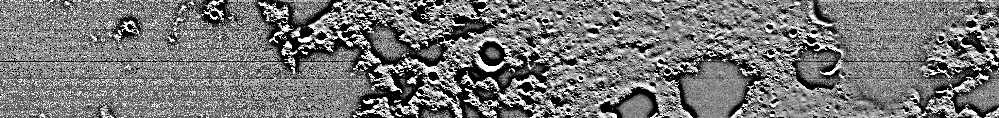

In [ ]:
color_img = cv.cvtColor(img, cv.COLOR_GRAY2BGR)

cv2_imshow(SSR(color_img, variance=15))

In [ ]:
hist= ahe(color_img)
denoised_image = cv.bilateralFilter(hist, 9, 75, 75)
cv2_imshow(hist)
print('-----------------------------------------------------------------------------------------------------------------------------------')
cv2_imshow(denoised_image)
print('-----------------------------------------------------------------------------------------------------------------------------------')
denoised_image = cv.fastNlMeansDenoising(hist, None, 10, 10, 7)  # Adjust parameters as needed
cv2_imshow(denoised_image)

In [ ]:
cv2_imshow(color_img)

In [ ]:
ret1 = SSR(color_img, variance=10)
ret2 = MSR(color_img, variance_list=[15, 20, 30])

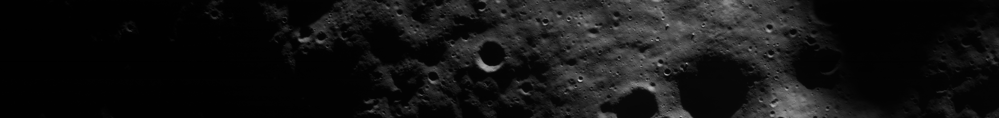

In [ ]:
cv2_imshow(color_img)

In [ ]:
cv2_imshow(ret1)
print('---------------------------------------------')
cv2_imshow(ret2)

In [ ]:
cv2_imshow((ret2-color_img))